The following notebook outlines the state of the lick/groom CNN model as of May 24, 2021.  

The repository containing the lick/groom CNN model is here:
https://github.com/AllenInstitute/lick_detection_cnn

The model was last trained in May of 2021. As of May, there are  24,550 annotated frames, distributed as follows:

* lick: 8,537
* groom: 1,307
* neither: 14,587
* ambiguous: 119 (these were frames that annotaters could not label and they were excluded from training)

So clearly the model is doing reasonably well on the held out test data. But as shown below, the model is still struggling under some circumstances. I think it is good enough for drawing broad conclusions about licking/grooming patterns, but it might still benefit from another round of annotation and training, with focus being on getting more passive session data and mesoscope data into the training set.

Doug Ollerenshaw

In [1]:
from visual_behavior.data_access import loading, from_lims
from multiprocessing import Pool
import pandas as pd
import visual_behavior.utilities as vbu
import visual_behavior.database as db
import matplotlib.pyplot as plt
import glob
import os
import seaborn as sns
import scipy 

from lick_detection_cnn.visualize import visualize_predictions
from lick_detection_cnn.lick_detection_model import LickDetectionModel, Generators
from lick_detection_cnn import evaluation

import visual_behavior.utilities as vbu
import visual_behavior.database as db
import scipy.misc
import numpy as np
import pandas as pd


import cv2

from tqdm import tqdm

import matplotlib.pyplot as plt

%load_ext autoreload
%autoreload 2

%matplotlib inline

Using TensorFlow backend.


In [2]:
from IPython.core.display import display, HTML
display(HTML("<style>.container { width:100% !important; }</style>"))

In [3]:
%matplotlib notebook

# start with some basic model characterization

## define paths

In [4]:
weights_path = '/allen/programs/braintv/workgroups/nc-ophys/visual_behavior/lick_detection_model/model_weights_checkpoint_2021-05-07T23_33_55.197649_n_gpus=1.h5'
image_path = '/local/lick_detection_model/lick_groom_model'

## load the csv that contains the record of frames used for training

In [5]:
all_image_table = pd.read_csv('~/code/lick_detection_cnn/support_files/train_test_validate_table.csv')
all_image_table

,frame_number,label,session_id,train_test_validate
0,9000,neither,976167513,validate
1,41599,lick,1004014391,test
2,41598,lick,1004014391,train
3,41597,lick,1004014391,train
4,41596,lick,1004014391,train
...,...,...,...,...
26948,117313,groom,1011877572,train
26949,117621,groom,1011877572,train
26950,6225,groom,1012635881,train
26951,98104,groom,1012635881,train


### get the count by label

In [6]:
pd.DataFrame(all_image_table['label'].value_counts()).rename(columns = {'label':'annotation count'})

,annotation count
neither,15489
lick,9025
groom,2320
ambiguous,119


### get the count by label and train/test/validate split

In [7]:
all_image_table.query('label != "ambiguous"').groupby(['label', 'train_test_validate'])[['frame_number']].count().rename(columns = {'frame_number':'annotation count'})

annotation count
label   train_test_validate                  
groom   test                              235
        train                            1857
        validate                          228
lick    test                              945
        train                            7180
        validate                          900
neither test                             1545
        train                           12407
        validate                         1537

## load the model

In [8]:
model = LickDetectionModel(weights_path=weights_path).model
generators = Generators(image_path , batch_size=16)

InvalidArgumentError: device CUDA:0 not supported by XLA service
	while setting up XLA_GPU_JIT device number 0

## get the predictions summary

In [9]:
predictions_summary = evaluation.make_prediction_summary(model, generators.test_generator)

In [10]:
predictions_summary.sample(10)

,filename,actual_class_index,actual_class_name,predicted_class_index,predicted_class_name,predicted_class_probability,correct_classification
515,/local/lick_detection_model/lick_groom_model/t...,1,lick,1,lick,0.999725,True
983,/local/lick_detection_model/lick_groom_model/t...,1,lick,1,lick,0.771267,True
2171,/local/lick_detection_model/lick_groom_model/t...,2,neither,2,neither,0.999977,True
469,/local/lick_detection_model/lick_groom_model/t...,1,lick,1,lick,0.996082,True
2404,/local/lick_detection_model/lick_groom_model/t...,2,neither,2,neither,0.998569,True
605,/local/lick_detection_model/lick_groom_model/t...,1,lick,1,lick,0.999980,True
1168,/local/lick_detection_model/lick_groom_model/t...,1,lick,1,lick,0.940691,True
2533,/local/lick_detection_model/lick_groom_model/t...,2,neither,2,neither,0.973322,True
2009,/local/lick_detection_model/lick_groom_model/t...,2,neither,2,neither,1.000000,True
302,/local/lick_detection_model/lick_groom_model/t...,1,lick,2,neither,0.945695,False


### get the confusion matrix on the test set

In [49]:
cm = evaluation.get_confusion_matrix(model, generators.test_generator, normalize=False)
cm

predicted_class             
                       groom lick neither
actual class                             
groom                    216    5      14
lick                       4  896      45
neither                    4   24    1517

In [76]:
cm = evaluation.get_confusion_matrix(model, generators.test_generator, normalize=True)
cm

predicted_class                    
                       groom      lick   neither
actual class                                    
groom               0.919149  0.021277  0.059574
lick                0.004233  0.948148  0.047619
neither             0.002589  0.015534  0.981877

# look at model performance across session types

## load the experiment table, get a list of session IDs

In [12]:
et = loading.get_filtered_ophys_experiment_table(release_data_only=True).reset_index()
osids = et.drop_duplicates(subset = 'ophys_session_id')['ophys_session_id']

## add a column called `session_type_simple` that allows us to lump all of the OPHYS_N sessions together

In [13]:
et['session_type_simple'] = et['session_type'].map(lambda st: st.split('_')[0] + '_' + st.split('_')[1])

## a function to load the lick/groom predictions, adding a column with the session ID

In [14]:
def load_lick_groom_predictions(osid):
    try:
        session = loading.get_ophys_dataset(from_lims.get_ophys_experiment_ids_for_ophys_session_id(osid).iloc[0][0])
        preds = session.behavior_movie_predictions.copy()
        preds['ophys_session_id'] = osid
        return preds.reset_index()
    except Exception as e:
        return pd.DataFrame()

## Now load the lick/groom predictions for all sessions, the concatenate them

In [15]:
with Pool(32) as pool:
    preds_list = pool.map(load_lick_groom_predictions, osids)

In [16]:
df = pd.concat(preds_list)
len(df)

65184656

## merge in some identifying info, then ensure that the length hasn't changed.

In [17]:
preds_df = df.merge(
    et[['ophys_session_id','session_type','session_type_simple','cre_line','equipment_name']].drop_duplicates(subset = 'ophys_session_id'),
    left_on = 'ophys_session_id',
    right_on = 'ophys_session_id',
    how = 'left'
)

In [18]:
len(preds_df)


65184656

## add a column with experiment time in minutes, as an integer. This will be useful for grouping by minute.

In [19]:

preds_df['minutes'] = preds_df['timestamps']/60
preds_df['minutes'] = preds_df['minutes'].astype(int)

In [20]:
preds_df.sample(10)

,frame_index,groom,lick,neither,timestamps,ophys_session_id,session_type,session_type_simple,cre_line,equipment_name,minutes
12986348,60508,7.953765e-07,4.293668e-06,0.999995,2017.07138,857202651,OPHYS_1_images_A,OPHYS_1,Slc17a7-IRES2-Cre,CAM2P.4,33
32442963,109091,4.062073e-11,1.552099e-10,1.000000,3636.59098,893937838,OPHYS_6_images_B,OPHYS_6,Slc17a7-IRES2-Cre,CAM2P.5,60
38524285,81597,2.785663e-09,4.691370e-08,1.000000,2720.05601,1003555861,OPHYS_3_images_B,OPHYS_3,Vip-IRES-Cre,CAM2P.3,45
12981190,55350,1.319451e-07,1.383842e-06,0.999998,1845.14361,857202651,OPHYS_1_images_A,OPHYS_1,Slc17a7-IRES2-Cre,CAM2P.4,30
23051810,706,1.193700e-07,1.958445e-07,1.000000,23.67088,1053696498,OPHYS_2_images_A_passive,OPHYS_2,Vip-IRES-Cre,CAM2P.4,0
24304855,30711,1.108838e-03,8.765917e-03,0.990125,1024.49432,994689422,OPHYS_6_images_A,OPHYS_6,Vip-IRES-Cre,CAM2P.4,17
47431962,55322,1.409155e-07,1.410257e-04,0.999859,1844.22236,965038745,OPHYS_3_images_B,OPHYS_3,Slc17a7-IRES2-Cre,CAM2P.4,30
40881850,129722,2.318242e-06,1.470996e-02,0.985288,4324.24104,1010373053,OPHYS_2_images_B_passive,OPHYS_2,Sst-IRES-Cre,CAM2P.3,72
5991434,2874,7.179936e-07,3.477668e-06,0.999996,95.95929,879897824,OPHYS_5_images_B_passive,OPHYS_5,Slc17a7-IRES2-Cre,CAM2P.3,1
50611286,102598,4.891849e-02,5.253167e-05,0.951029,3419.96030,974167263,OPHYS_5_images_B_passive,OPHYS_5,Slc17a7-IRES2-Cre,MESO.1,56


## Now make a new dataframe that is grouped by session ID and minute, taking the mean probabilities in each minute
Note that I identified one session ID with egregiously bad predictions - 994869518. This was a passive session where the lick probability was consistently near one, despite there clearly being no licks. I removed this from the grouped dataframe for now, but I should really sample some frames from this movie and feed them back into the model to improve training. There must be some particular feature in this movie that is distinct and is throwing off the model.`m

In [21]:
bad_ids = [] #[994869518] ## sessions with known bad predictions

preds_by_minute = preds_df.query('ophys_session_id not in @bad_ids').groupby(['ophys_session_id', 'minutes'])['lick','groom','neither'].mean().reset_index().merge(
    et[['ophys_session_id','session_type','session_type_simple','cre_line','equipment_name']].drop_duplicates(subset = 'ophys_session_id'),
    left_on = 'ophys_session_id',
    right_on = 'ophys_session_id',
    how = 'left'
)

## Make a function to plot the probability for each 1 minute bin

In [81]:
def plot_lick_prob_single_session_type(data_to_plot, ax, y_value, hue=None):
    sns.lineplot(
        data = data_to_plot,
        x = 'minutes',
        y = y_value,
        ax = ax,
        n_boot = 1000,
        hue=hue,
        legend=None,
        palette='Set2'
    )
    ax.set_xlim(0, 70)
#     ax.set_ylim(0, 0.125)
    ax.set_ylabel('mean\nlick\nprobability', rotation = 0, va='center', labelpad = 30)
    
    

def plot_lick_prob_by_minute(preds_by_minute, to_plot='lick', sharey=True, hue=None):
    
    fig, ax = plt.subplots(6, 1, figsize=(6,8), sharex=True, sharey=sharey)
    for session_number in range(6):
        data_to_plot = preds_by_minute.query('session_type_simple == "OPHYS_{}"'.format(session_number + 1))
        plot_lick_prob_single_session_type(data_to_plot, ax[session_number], y_value=to_plot, hue=hue)
        ax[session_number].set_title('session type = OPHYS_{}'.format(session_number + 1))
        
    fig.tight_layout()
    plt.subplots_adjust(top = 0.9)
    fig.suptitle('mean {} probability in one minute bins'.format(to_plot))
    
    return fig, ax

## plot licks for each 1 minute bin
A few things that stand out:
1. lick probability gradually declines in the active sessions, which matches with what we know about declining motivation.  
2. in the active sessions, you can see the onset of licking at the end of the gray screen period @ 5 minutes (i.e., when the actual task begins).  
3. in the passive sessions, there is very little licking in those first five minutes, which implies that pre-watered mice aren't eagerly trying to lick in those first few minutes.  

<IPython.core.display.Javascript object>


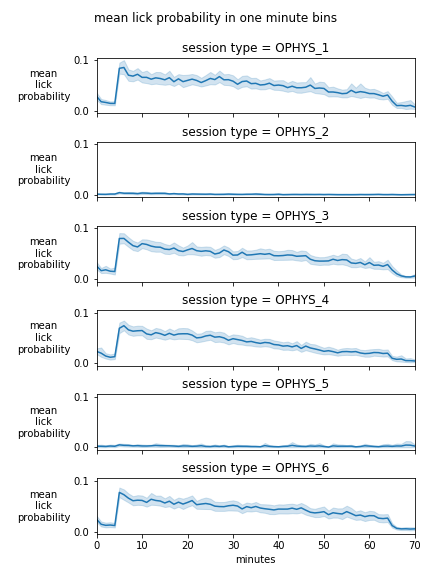

In [23]:
plot_lick_prob_by_minute(preds_by_minute, to_plot='lick');

<IPython.core.display.Javascript object>


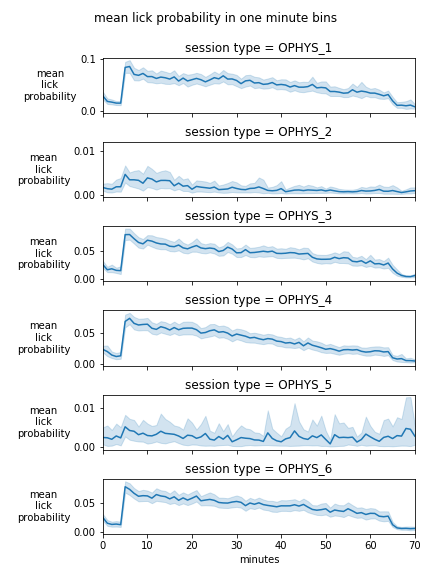

In [24]:
plot_lick_prob_by_minute(preds_by_minute, to_plot='lick', sharey=False);

### repeat the plot, but now with each session as a distinct line
This emphasizes some of the variability

<IPython.core.display.Javascript object>


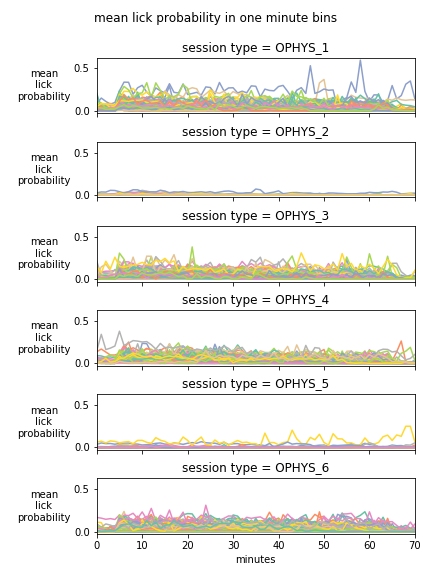

In [77]:
plot_lick_prob_by_minute(preds_by_minute, to_plot='lick', hue='ophys_session_id', sharey=True);

<IPython.core.display.Javascript object>


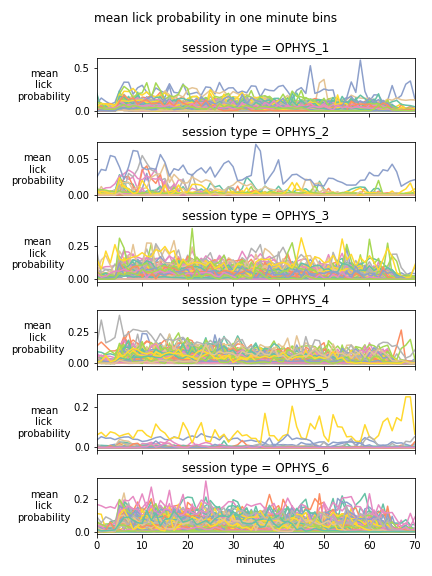

In [78]:
plot_lick_prob_by_minute(preds_by_minute, to_plot='lick', hue='ophys_session_id', sharey=False);

In [26]:
preds_by_minute

,ophys_session_id,minutes,lick,groom,neither,session_type,session_type_simple,cre_line,equipment_name
0,775289198,0,7.991580e-03,3.334982e-05,0.991975,OPHYS_1_images_A,OPHYS_1,Slc17a7-IRES2-Cre,CAM2P.5
1,775289198,1,2.182679e-03,3.420712e-05,0.997783,OPHYS_1_images_A,OPHYS_1,Slc17a7-IRES2-Cre,CAM2P.5
2,775289198,2,9.731297e-04,3.901509e-05,0.998988,OPHYS_1_images_A,OPHYS_1,Slc17a7-IRES2-Cre,CAM2P.5
3,775289198,3,4.704527e-04,1.961656e-05,0.999510,OPHYS_1_images_A,OPHYS_1,Slc17a7-IRES2-Cre,CAM2P.5
4,775289198,4,9.390637e-04,3.730047e-05,0.999024,OPHYS_1_images_A,OPHYS_1,Slc17a7-IRES2-Cre,CAM2P.5
...,...,...,...,...,...,...,...,...,...
36485,1071202230,71,1.036310e-07,1.034376e-07,1.000000,OPHYS_6_images_B,OPHYS_6,Vip-IRES-Cre,CAM2P.4
36486,1071202230,72,9.046886e-08,3.273362e-07,1.000000,OPHYS_6_images_B,OPHYS_6,Vip-IRES-Cre,CAM2P.4
36487,1071202230,73,2.241418e-06,1.018187e-03,0.998980,OPHYS_6_images_B,OPHYS_6,Vip-IRES-Cre,CAM2P.4
36488,1071202230,74,2.656360e-07,5.149475e-07,0.999999,OPHYS_6_images_B,OPHYS_6,Vip-IRES-Cre,CAM2P.4


## plot grooming probabilities in 1 minute bins
These are pretty variable. There don't appear to be strong trends across active/passive, or for particular epochs where grooming is generally high

<IPython.core.display.Javascript object>


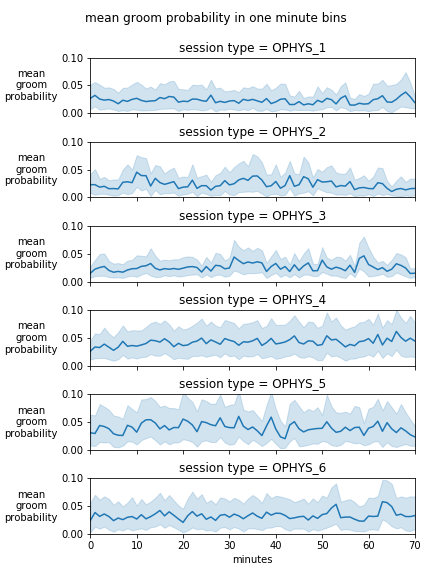

In [84]:
fig, ax = plot_lick_prob_by_minute(preds_by_minute, to_plot='groom', sharey=True);
ax[0].set_ylim(0, 0.1)
for axis in ax:
    axis.set_ylabel('mean\ngroom\nprobability')

<IPython.core.display.Javascript object>


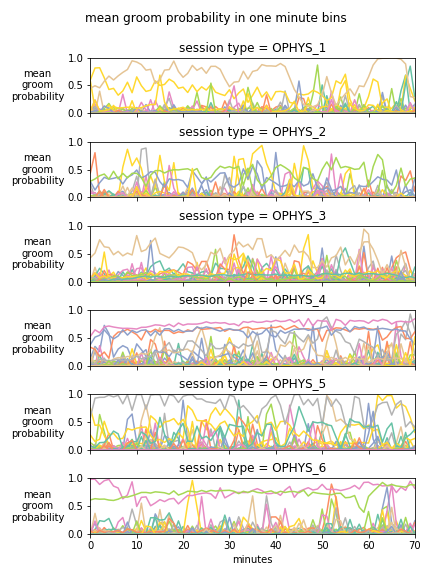

In [88]:
fig, ax = plot_lick_prob_by_minute(preds_by_minute, to_plot='groom', sharey=True, hue='ophys_session_id');
ax[0].set_ylim(0, 1)
for axis in ax:
    axis.set_ylabel('mean\ngroom\nprobability')

<IPython.core.display.Javascript object>


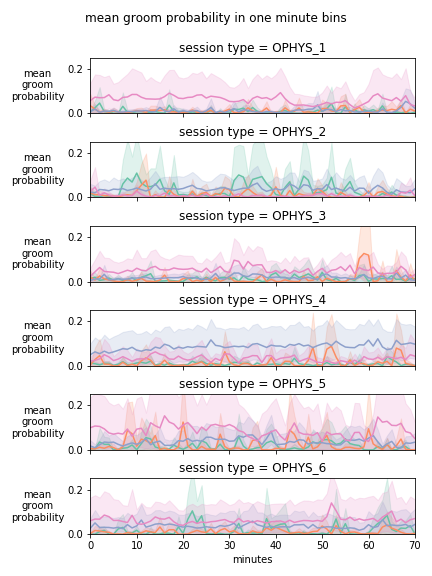

In [90]:
fig, ax = plot_lick_prob_by_minute(preds_by_minute, to_plot='groom', sharey=True, hue='equipment_name');
ax[0].set_ylim(0, 0.25)
for axis in ax:
    axis.set_ylabel('mean\ngroom\nprobability')

In [28]:
mean_probs = preds_df.groupby(['ophys_session_id'])[['lick','groom','neither']].mean().reset_index()
print(len(mean_probs))
mean_probs = mean_probs.merge(
    et,
    left_on = ['ophys_session_id'],
    right_on = ['ophys_session_id']
).drop_duplicates(subset=['ophys_session_id'])
print(len(mean_probs))

477
477


In [33]:
mean_probs.query('ophys_session_id == 1056065360').iloc[0]

ophys_session_id                                                      1056065360
lick                                                                    0.010797
groom                                                                   0.800195
neither                                                                 0.189008
ophys_experiment_id                                                   1056171522
equipment_name                                                            MESO.1
full_genotype                      Vip-IRES-Cre/wt;Ai148(TIT2L-GC6f-ICL-tTA2)/wt
mouse_id                                                                  528097
reporter_line                                         Ai148(TIT2L-GC6f-ICL-tTA2)
driver_line                                                       [Vip-IRES-Cre]
sex                                                                            F
age_in_days                                                                  187
cre_line                    

## a function to plot a single frame

In [29]:
def plot_frame(osid, frame_index, ax):
    v = db.get_well_known_files(osid).loc['RawBehaviorTrackingVideo']
    m = vbu.Movie(''.join((v['storage_directory'], v['filename'])))
    ax.imshow(m.get_frame(frame_index))

## a function to plot 10 sample frames from every session type for a given probability range

In [30]:
def plot_examples_by_session(to_plot, low_bound_prob, high_bound_prob = 1):
    n_cols = 10
    fig, ax = plt.subplots(6, n_cols, sharex=True, sharey=True, figsize = (20,10))
    for session_number in range(6):
        sample = preds_df.query('session_type_simple == "OPHYS_{}" and {} > {} and {} < {}'.format((session_number + 1), to_plot, low_bound_prob, to_plot, high_bound_prob)).sample(n_cols, random_state = 1)
        for idx, entry in sample.reset_index().iterrows():
            plot_frame(entry['ophys_session_id'], entry['frame_index'], ax[session_number, idx])
            ax[session_number, idx].set_xticks([])
            ax[session_number, idx].set_yticks([])
            ax[session_number, idx].set_title('probability = {:0.2f}'.format(entry[to_plot]), fontsize = 8)
    #         break

        ax[session_number, 0].set_ylabel('session\ntype\nOPHYS_{}'.format(session_number + 1), va = 'center', rotation = 0, labelpad = 30)

    fig.tight_layout()
    plt.subplots_adjust(hspace=0.2, wspace = 0.01, top=0.9)
    return fig, ax

## look at high probability licks:
These seem to be mostly licks, so the model seems to be doing well, at least when it has high confidence. But note that there aren't any mesoscope sessions in this sample. Maybe the model needs more mesoscope training data

<IPython.core.display.Javascript object>


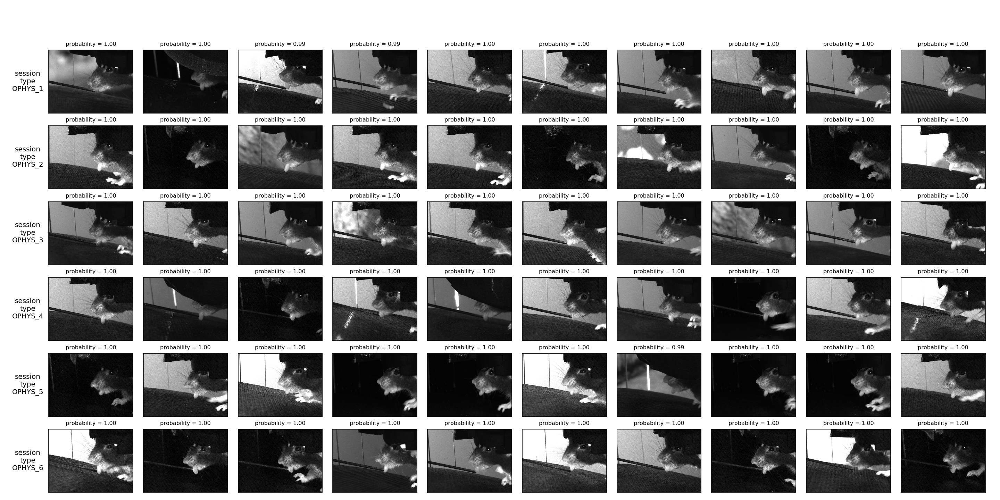

In [46]:
plot_examples_by_session(
    to_plot = 'lick', 
    low_bound_prob = 0.99, 
    high_bound_prob = 1
);

## look at high probability grooming bouts:
These also seem reasonable, but the same caveat about the lack of mesoscope data applies here.


<IPython.core.display.Javascript object>


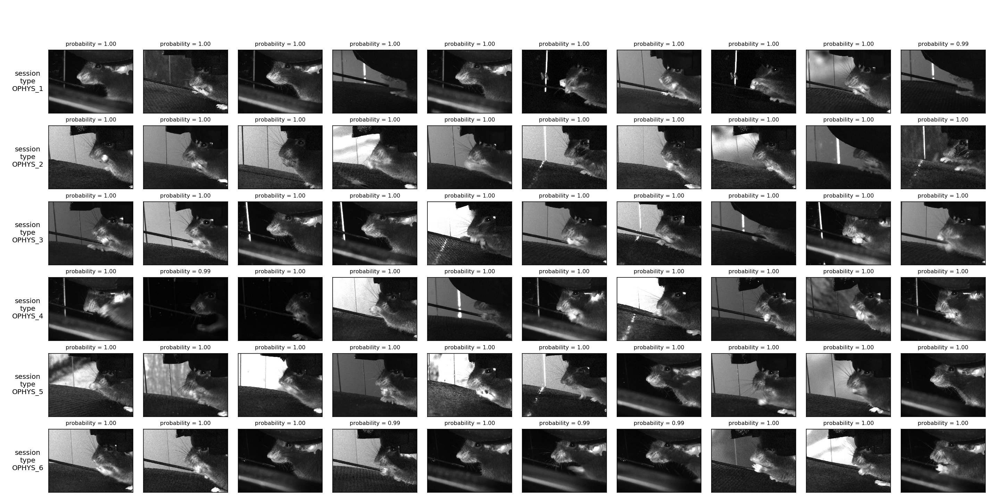

In [38]:
plot_examples_by_session(
    to_plot = 'groom', 
    low_bound_prob = 0.99, 
    high_bound_prob = 1
);

## look at lower probability licks:
Ther seem to be a fair number of mis-labeled frames here:
    * non-licks labeled as licks
    * grooms labeled as licks
    
One caveat, though. I've previously observed that the model has a somewhat uncanny ability to assign elevated licking probabilities to the frames immediately preceding and following actual licks. It's likely that there's some other feature of the face beyond just the presence of the tongue (maybe the whisker pad?) that the model is using to assign the licking probability.  

So while it looks like there are a lot of frames in that last image that are labeled 'lick' with high probability that obviously aren't licks, it may be that the animal just licked, or was just about to lick.

<IPython.core.display.Javascript object>


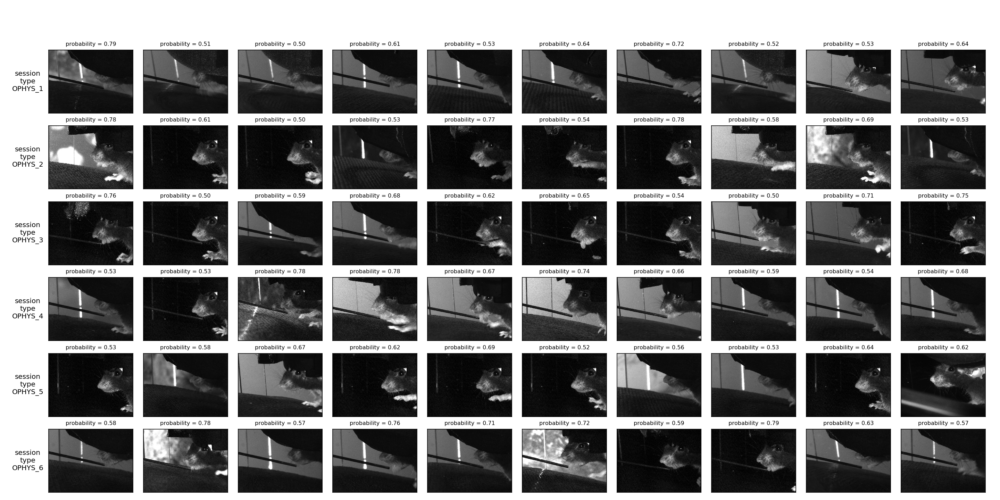

In [41]:
plot_examples_by_session(
    to_plot = 'lick', 
    low_bound_prob = 0.5, 
    high_bound_prob = 0.8
);

## look at lower probability grooms:
There also seem to be quite a few false positives here. 

<IPython.core.display.Javascript object>


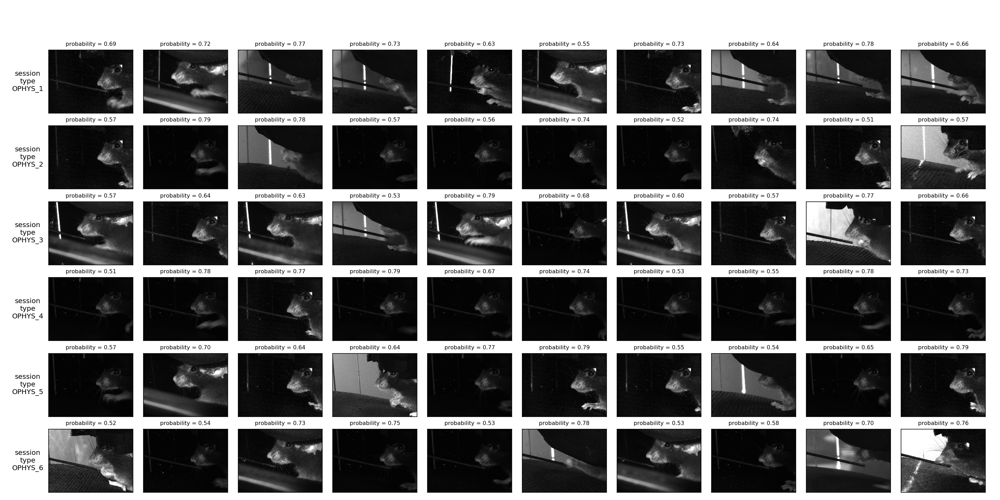

In [42]:
plot_examples_by_session(
    to_plot = 'groom', 
    low_bound_prob = 0.5, 
    high_bound_prob = 0.8
);

## look at the distribution of mean licking and grooming
The outliers likely represent problem sessions

<IPython.core.display.Javascript object>


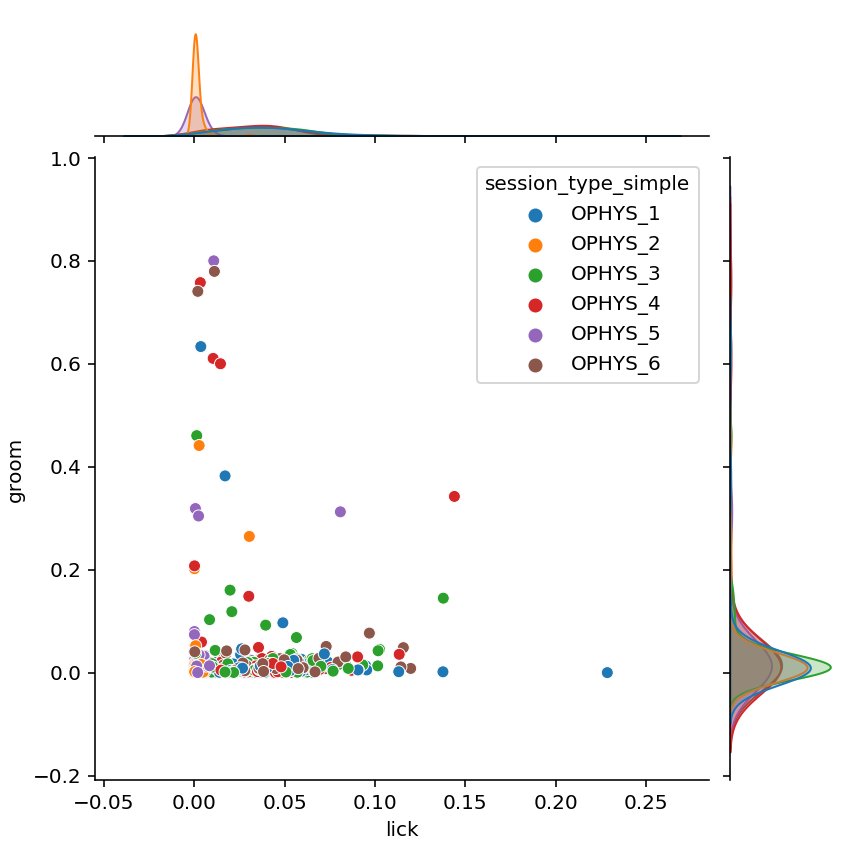

In [28]:
sns.jointplot(
    data = mean_probs,
    x='lick',
    y='groom',
    hue='session_type_simple',
    hue_order=np.sort(mean_probs['session_type_simple'].unique())
)

<IPython.core.display.Javascript object>


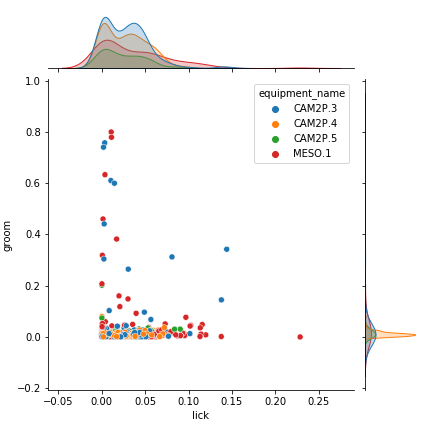

In [91]:
sns.jointplot(
    data = mean_probs,
    x='lick',
    y='groom',
    hue='equipment_name',
    hue_order=np.sort(mean_probs['equipment_name'].unique())
)

### look at sessions with mean groom probabilities above 0.5 (this is unlikely to be true!)

In [33]:
mean_probs.query('groom > 0.5')

,ophys_session_id,lick,groom,neither,ophys_experiment_id,equipment_name,full_genotype,mouse_id,reporter_line,driver_line,...,prior_exposures_to_omissions,behavior_session_id,ophys_container_id,project_code,imaging_depth,targeted_structure,date_of_acquisition,session_type,file_id,session_type_simple
980,1052096166,0.003641,0.633574,0.362785,1052212181,MESO.1,Vip-IRES-Cre/wt;Ai148(TIT2L-GC6f-ICL-tTA2)/wt,528097,Ai148(TIT2L-GC6f-ICL-tTA2),[Vip-IRES-Cre],...,0,1052162546,1052096570,VisualBehaviorMultiscope,225,VISl,2020-09-22 10:43:29.464010,OPHYS_1_images_A,1085402188,OPHYS_1
993,1056065360,0.010797,0.800195,0.189008,1056171522,MESO.1,Vip-IRES-Cre/wt;Ai148(TIT2L-GC6f-ICL-tTA2)/wt,528097,Ai148(TIT2L-GC6f-ICL-tTA2),[Vip-IRES-Cre],...,9,1056084114,1052096554,VisualBehaviorMultiscope,150,VISp,2020-10-12 09:12:40.151986,OPHYS_5_images_B_passive,1085402232,OPHYS_5
996,1056238781,0.011156,0.779704,0.209141,1057725798,MESO.1,Vip-IRES-Cre/wt;Ai148(TIT2L-GC6f-ICL-tTA2)/wt,528097,Ai148(TIT2L-GC6f-ICL-tTA2),[Vip-IRES-Cre],...,10,1056253022,1052096554,VisualBehaviorMultiscope,158,VISp,2020-10-13 09:46:25.940282,OPHYS_6_images_B,1085393860,OPHYS_6
1001,1057486216,0.010470,0.610616,0.378914,1057706462,CAM2P.3,Slc17a7-IRES2-Cre/wt;Camk2a-tTA/wt;Ai93(TITL-G...,539517,Ai93(TITL-GCaMP6f),"[Slc17a7-IRES2-Cre, Camk2a-tTA]",...,7,1057533246,1054675423,VisualBehaviorTask1B,175,VISp,2020-10-19 16:04:21.000000,OPHYS_4_images_A,1057815880,OPHYS_4
1003,1058058727,0.014527,0.600171,0.385302,1058275574,CAM2P.3,Slc17a7-IRES2-Cre/wt;Camk2a-tTA/wt;Ai93(TITL-G...,539517,Ai93(TITL-GCaMP6f),"[Slc17a7-IRES2-Cre, Camk2a-tTA]",...,9,1058072139,1054675423,VisualBehaviorTask1B,175,VISp,2020-10-21 16:15:28.000000,OPHYS_4_images_A,1058348900,OPHYS_4
1004,1058683693,0.003371,0.757895,0.238734,1058813457,CAM2P.3,Slc17a7-IRES2-Cre/wt;Camk2a-tTA/wt;Ai93(TITL-G...,539517,Ai93(TITL-GCaMP6f),"[Slc17a7-IRES2-Cre, Camk2a-tTA]",...,11,1058696622,1054675423,VisualBehaviorTask1B,175,VISp,2020-10-23 16:36:28.000000,OPHYS_4_images_A,1058852962,OPHYS_4
1005,1059214492,0.001986,0.740912,0.257101,1059340828,CAM2P.3,Slc17a7-IRES2-Cre/wt;Camk2a-tTA/wt;Ai93(TITL-G...,539517,Ai93(TITL-GCaMP6f),"[Slc17a7-IRES2-Cre, Camk2a-tTA]",...,12,1059236465,1054675423,VisualBehaviorTask1B,175,VISp,2020-10-26 16:22:24.000000,OPHYS_6_images_A,1059412930,OPHYS_6


<IPython.core.display.Javascript object>


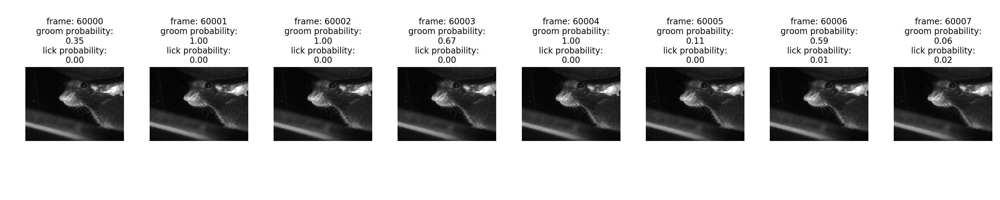

In [65]:
osid = 1056065360
first_frame = 60000
n_frames = 8
fig, ax = plt.subplots(1,n_frames,figsize=(20,4))
for i in range(n_frames):
    frame_number = first_frame + i
    plot_frame(osid, +i, ax[i])
    ax[i].axis('off')
    groom_prob = preds_df.query('ophys_session_id == @osid and frame_index == {}'.format(frame_number))['groom'].iloc[0]
    lick_prob = preds_df.query('ophys_session_id == @osid and frame_index == {}'.format(frame_number))['lick'].iloc[0]
    ax[i].set_title('frame: {}\ngroom probability:\n{:0.2f}\nlick probability:\n{:0.2f}'.format(frame_number, groom_prob, lick_prob))
fig.tight_layout()

### Note that this particular session has no examples in the train/test/validate set

In [59]:
all_image_table.query('session_id == @osid')

,frame_number,label,session_id,train_test_validate


### one more example

<IPython.core.display.Javascript object>


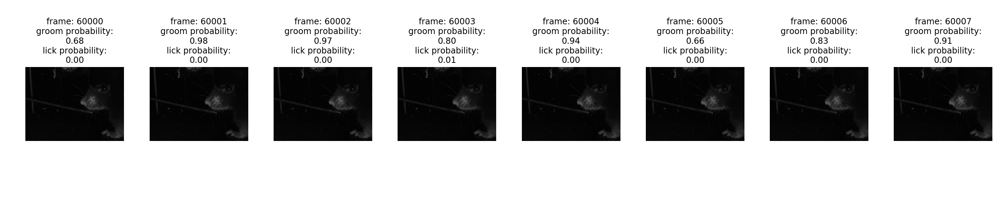

In [66]:
osid = 1058683693
first_frame = 60000
n_frames = 8
fig, ax = plt.subplots(1,n_frames,figsize=(20,4))
for i in range(n_frames):
    frame_number = first_frame + i
    plot_frame(osid, +i, ax[i])
    ax[i].axis('off')
    groom_prob = preds_df.query('ophys_session_id == @osid and frame_index == {}'.format(frame_number))['groom'].iloc[0]
    lick_prob = preds_df.query('ophys_session_id == @osid and frame_index == {}'.format(frame_number))['lick'].iloc[0]
    ax[i].set_title('frame: {}\ngroom probability:\n{:0.2f}\nlick probability:\n{:0.2f}'.format(frame_number, groom_prob, lick_prob))
fig.tight_layout()

In [67]:
all_image_table.query('session_id == @osid')

,frame_number,label,session_id,train_test_validate


In [58]:
pd.set_option('display.max_rows', 500)
pd.set_option('display.max_columns', 500)

In [60]:
mean_probs.query('session_type_simple == "OPHYS_2" and lick > 0.001 and lick < 0.1')

,ophys_session_id,lick,groom,neither,ophys_experiment_id,equipment_name,full_genotype,mouse_id,reporter_line,driver_line,sex,age_in_days,cre_line,indicator,session_number,prior_exposures_to_session_type,prior_exposures_to_image_set,prior_exposures_to_omissions,behavior_session_id,ophys_container_id,project_code,imaging_depth,targeted_structure,date_of_acquisition,session_type,file_id,session_type_simple
51,843049997,0.001368,0.020267,0.978364,843519218,CAM2P.3,Slc17a7-IRES2-Cre/wt;Camk2a-tTA/wt;Ai93(TITL-G...,440298,Ai93(TITL-GCaMP6f),"[Slc17a7-IRES2-Cre, Camk2a-tTA]",M,109.0,Slc17a7-IRES2-Cre,GCaMP6f,2,0,13.0,1,843203333,843049827,VisualBehavior,375,VISp,2019-03-29 14:48:02.000000,OPHYS_2_images_A_passive,911496273,OPHYS_2
60,847758278,0.002178,0.000576,0.997246,848039121,MESO.1,Vip-IRES-Cre/wt;Ai148(TIT2L-GC6f-ICL-tTA2)/wt,438912,Ai148(TIT2L-GC6f-ICL-tTA2),[Vip-IRES-Cre],M,127.0,Vip-IRES-Cre,GCaMP6f,2,0,21.0,1,847867029,1018027862,VisualBehaviorMultiscope,150,VISl,2019-04-08 12:09:22.000000,OPHYS_2_images_A_passive,1086012595,OPHYS_2
68,848891498,0.004726,0.004410,0.990864,849199228,CAM2P.4,Slc17a7-IRES2-Cre/wt;Camk2a-tTA/wt;Ai93(TITL-G...,436662,Ai93(TITL-GCaMP6f),"[Slc17a7-IRES2-Cre, Camk2a-tTA]",M,139.0,Slc17a7-IRES2-Cre,GCaMP6f,2,0,36.0,1,849136474,846213087,VisualBehavior,375,VISp,2019-04-10 16:45:25.000000,OPHYS_2_images_A_passive,911497472,OPHYS_2
143,870352564,0.006490,0.006850,0.986660,875564408,MESO.1,Vip-IRES-Cre/wt;Ai148(TIT2L-GC6f-ICL-tTA2)/wt,449653,Ai148(TIT2L-GC6f-ICL-tTA2),[Vip-IRES-Cre],M,119.0,Vip-IRES-Cre,GCaMP6f,2,0,14.0,0,870660821,1018027611,VisualBehaviorMultiscope,225,VISl,2019-05-17 08:56:51.000000,OPHYS_2_images_A_passive,1085397929,OPHYS_2
440,931326814,0.001335,0.003640,0.995025,932372699,MESO.1,Vip-IRES-Cre/wt;Ai148(TIT2L-GC6f-ICL-tTA2)/wt,453988,Ai148(TIT2L-GC6f-ICL-tTA2),[Vip-IRES-Cre],M,199.0,Vip-IRES-Cre,GCaMP6f,2,0,0.0,2,931566300,1026722861,VisualBehaviorMultiscope,221,VISp,2019-08-26 08:26:26.815263,OPHYS_2_images_B_passive,1086012732,OPHYS_2
446,932664150,0.001449,0.002506,0.996045,933338719,CAM2P.3,Vip-IRES-Cre/wt;Ai148(TIT2L-GC6f-ICL-tTA2)/wt,467951,Ai148(TIT2L-GC6f-ICL-tTA2),[Vip-IRES-Cre],M,133.0,Vip-IRES-Cre,GCaMP6f,2,0,27.0,1,932884713,928325203,VisualBehaviorTask1B,175,VISp,2019-08-27 17:32:29.000000,OPHYS_2_images_B_passive,934559985,OPHYS_2
488,938898514,0.001263,0.004070,0.994668,939471259,MESO.1,Vip-IRES-Cre/wt;Ai148(TIT2L-GC6f-ICL-tTA2)/wt,453989,Ai148(TIT2L-GC6f-ICL-tTA2),[Vip-IRES-Cre],M,208.0,Vip-IRES-Cre,GCaMP6f,2,0,52.0,1,938991494,1018028408,VisualBehaviorMultiscope,225,VISl,2019-09-04 15:26:03.762805,OPHYS_2_images_A_passive,1086012500,OPHYS_2
521,942384133,0.001126,0.027596,0.971278,943134119,CAM2P.4,Vip-IRES-Cre/wt;Ai148(TIT2L-GC6f-ICL-tTA2)/wt,468866,Ai148(TIT2L-GC6f-ICL-tTA2),[Vip-IRES-Cre],F,146.0,Vip-IRES-Cre,GCaMP6f,2,0,19.0,5,942562699,929913236,VisualBehavior,175,VISp,2019-09-10 17:57:45.000000,OPHYS_2_images_A_passive,944214327,OPHYS_2
536,947199653,0.001174,0.002300,0.996526,947798783,MESO.1,Vip-IRES-Cre/wt;Ai148(TIT2L-GC6f-ICL-tTA2)/wt,453991,Ai148(TIT2L-GC6f-ICL-tTA2),[Vip-IRES-Cre],M,220.0,Vip-IRES-Cre,GCaMP6f,2,2,36.0,6,947336783,1022731540,VisualBehaviorMultiscope,150,VISl,2019-09-16 11:47:43.190731,OPHYS_2_images_A_passive,1085401477,OPHYS_2
636,962736894,0.001323,0.006043,0.992634,963394081,CAM2P.3,Vip-IRES-Cre/wt;Ai148(TIT2L-GC6f-ICL-tTA2)/wt,467954,Ai148(TIT2L-GC6f-ICL-tTA2),[Vip-IRES-Cre],M,175.0,Vip-IRES-Cre,GCaMP6f,2,0,27.0,3,962922731,969421516,VisualBehaviorTask1B,175,VISp,2019-10-08 15:27:11.000000,OPHYS_2_images_B_passive,963457965,OPHYS_2


In [61]:
preds_df.query('ophys_session_id == 1010373053 and lick > 0.9').iloc[:100]

,frame_index,groom,lick,neither,timestamps,ophys_session_id,session_type,session_type_simple,cre_line,equipment_name,minutes
40752196,68,3.406458e-04,0.999570,0.000089,2.36609,1010373053,OPHYS_2_images_B_passive,OPHYS_2,Sst-IRES-Cre,CAM2P.3,0
40752197,69,4.311683e-04,0.999463,0.000106,2.39888,1010373053,OPHYS_2_images_B_passive,OPHYS_2,Sst-IRES-Cre,CAM2P.3,0
40752208,80,1.597033e-06,0.999954,0.000044,2.76779,1010373053,OPHYS_2_images_B_passive,OPHYS_2,Sst-IRES-Cre,CAM2P.3,0
40755074,2946,1.525937e-04,0.984878,0.014969,98.30023,1010373053,OPHYS_2_images_B_passive,OPHYS_2,Sst-IRES-Cre,CAM2P.3,1
40755081,2953,7.276329e-04,0.999089,0.000183,98.53239,1010373053,OPHYS_2_images_B_passive,OPHYS_2,Sst-IRES-Cre,CAM2P.3,1
40755225,3097,4.136915e-04,0.989453,0.010133,103.33933,1010373053,OPHYS_2_images_B_passive,OPHYS_2,Sst-IRES-Cre,CAM2P.3,1
40755226,3098,6.464877e-06,0.999856,0.000138,103.36550,1010373053,OPHYS_2_images_B_passive,OPHYS_2,Sst-IRES-Cre,CAM2P.3,1
40755231,3103,5.029757e-03,0.935305,0.059665,103.53250,1010373053,OPHYS_2_images_B_passive,OPHYS_2,Sst-IRES-Cre,CAM2P.3,1
40755433,3305,5.611704e-04,0.925837,0.073602,110.26585,1010373053,OPHYS_2_images_B_passive,OPHYS_2,Sst-IRES-Cre,CAM2P.3,1
40755434,3306,9.198196e-06,0.999971,0.000020,110.29909,1010373053,OPHYS_2_images_B_passive,OPHYS_2,Sst-IRES-Cre,CAM2P.3,1


<IPython.core.display.Javascript object>


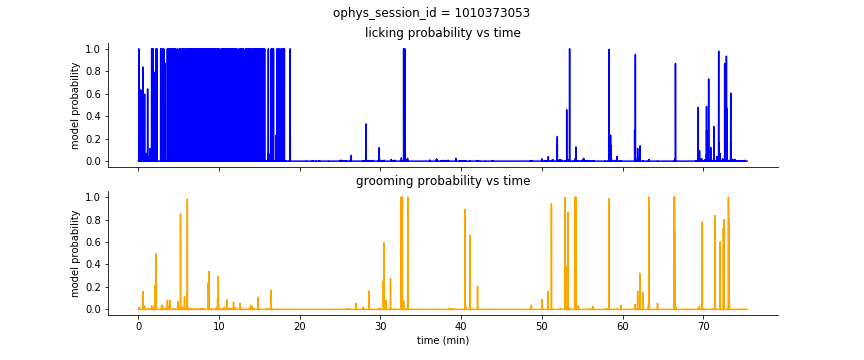

Text(0.5, 0.98, 'ophys_session_id = 1010373053')

In [75]:
osid = 1010373053
x = 'timestamps'

fig, ax = plt.subplots(2, 1, figsize = (12,5), sharex=True)
ax[0].plot(
    preds_df.query('ophys_session_id == @osid')[x]/60,
    preds_df.query('ophys_session_id == @osid')['lick'],
    color='blue'
)
ax[0].set_title('licking probability vs time')
ax[0].set_ylabel('model probability')
ax[1].plot(
    preds_df.query('ophys_session_id == @osid')[x]/60,
    preds_df.query('ophys_session_id == @osid')['groom'],
    color='orange'
)
ax[1].set_title('grooming probability vs time')
ax[1].set_ylabel('model probability')
ax[1].set_xlabel('time (min)')
sns.despine()
fig.suptitle('ophys_session_id = {}'.format(osid))

In [97]:
list(np.sort([a for a in annotations['username'].unique() if a not in [None, 'unknown', '']]))

['alex.piet',
 'aliw',
 'beno',
 'chelsean',
 'conor.grasso',
 'conorg',
 'corbett',
 'dougo',
 'iryna.yavorska',
 'jackies',
 'kater',
 'katn',
 'linzyc',
 'marinag',
 'paul.rhoads',
 'peterg',
 'taminar',
 'tye.johnson']

In [99]:
all_image_table.query('label == "ambiguous"').sample(8)

,frame_number,label,session_id,train_test_validate
14200,67121,ambiguous,871606557,train
1763,23941,ambiguous,974479344,train
2120,9989,ambiguous,974017068,train
5690,44550,ambiguous,949356610,train
2765,27896,ambiguous,967453801,train
9510,4383,ambiguous,918164391,train
2321,71119,ambiguous,972293086,train
16257,47837,ambiguous,846026867,train


<IPython.core.display.Javascript object>


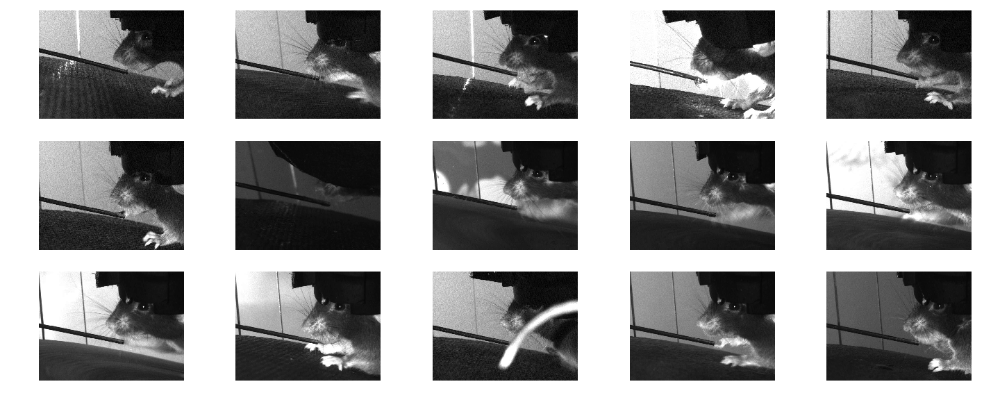

In [106]:
n_frames = 15
fig, ax = plt.subplots(3,5,figsize=(20,8))
for idx, row in all_image_table.query('label == "ambiguous"').sample(n_frames, random_state=1).reset_index().iterrows():
    plot_frame(row['session_id'], row['frame_number'], ax.flatten()[idx])
    ax.flatten()[idx].axis('off')
fig.tight_layout()

In [102]:
row['ophys_session_id']

KeyError: 'ophys_session_id'